In [3]:
import numpy as np
import torch

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

ModuleNotFoundError: No module named 'torch'

In [3]:
raw = np.load('./dataset/rawData.npy', allow_pickle=True)

In [1]:
image_paths = []
plt.figure(figsize=(12, 8))
for i, name in zip(range(3), ['x', 'y', 'p']):
    for dim in [16, 32, 64, 128, 256]:
        reducer = PCA(n_components=2)
        latent = np.load(f'latent/latent_l{dim}.npy')
        x_reduced = reducer.fit_transform(latent[0,:,:,i])

        
        fig, ax = plt.subplots(1)
        plt.scatter(x_reduced[:,0], x_reduced[:,1], c=np.arange(len(x_reduced)), cmap="inferno")
        plt.title(f'PCA on latent@dim={dim} of {name} of Trajectory 1 (val)')
        plt.ylabel('C_1')
        plt.xlabel('C_0')
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        norm = plt.Normalize(0, len(x_reduced))
        sm = plt.cm.ScalarMappable(cmap="inferno", norm=norm)
        fig.colorbar(sm, cax=cax, orientation="vertical")
        plt.title('Timesteps')
        fname = f'visualization/pca_val_latent_{name}_dim{dim}.png'
        plt.savefig(fname)
        plt.clf()
        image_paths.append(fname)
        
fig, axes = plt.subplots(3, 5, figsize=(60, 24))
for i, ax in enumerate(axes.flat):
    img = plt.imread(image_paths[i])  # Read image
    ax.imshow(img)                      # Display image
    ax.axis('off')                      # Hide axes
plt.tight_layout()
plt.savefig('visualization/pca_val_latent.png', bbox_inches='tight', dpi=300)
plt.show()

NameError: name 'plt' is not defined

<Figure size 2880x1200 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

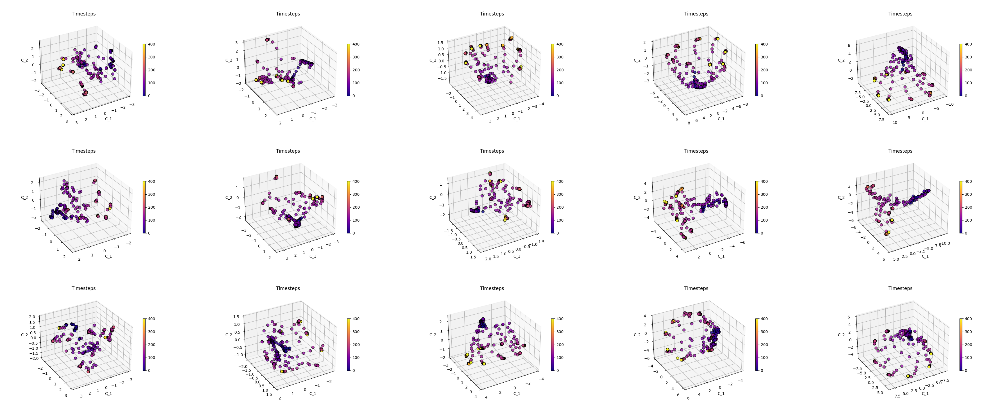

In [248]:
from mpl_toolkits.mplot3d import Axes3D

image_paths = []
plt.figure(figsize=(24, 10), dpi=120)
for i, name in zip(range(3), ['x', 'y', 'p']):
    for dim in [16, 32, 64, 128, 256]:
        reducer = PCA(n_components=3)
        latent = np.load(f'latent/latent_l{dim}.npy')
        x_reduced = reducer.fit_transform(latent[0,:,:,i])

        
        fig, ax = plt.subplots(1, subplot_kw={'projection': '3d'})
        ax.view_init(elev=30, azim=60)
        ax.scatter(x_reduced[:,0], x_reduced[:,1], x_reduced[:,2], c=np.arange(len(x_reduced)), cmap="plasma", alpha=0.8, edgecolors='black', s=50, marker='o')
        plt.title(f'PCA on latent@dim={dim} of {name} of Trajectory 1 (val)')
        ax.set_xlabel('C_0')
        ax.set_ylabel('C_1')
        ax.set_zlabel('C_2')
        #divider = make_axes_locatable(ax)
        #cax = divider.append_axes("right", size="5%", pad=0.05)
        norm = plt.Normalize(0, len(x_reduced))
        sm = plt.cm.ScalarMappable(cmap="plasma", norm=norm)
        fig.colorbar(sm, ax=ax, orientation="vertical", aspect=20, shrink=0.5)
        plt.title('Timesteps')
        fname = f'nvidia_visualizations/pca_val_latent_3d_{name}_dim{dim}.png'
        plt.savefig(fname)
        plt.clf()
        image_paths.append(fname)
        
fig, axes = plt.subplots(3, 5, figsize=(60, 24))
for i, ax in enumerate(axes.flat):
    img = plt.imread(image_paths[i])  # Read image
    ax.imshow(img)                      # Display image
    ax.axis('off')                      # Hide axes
plt.tight_layout()
plt.savefig('pca_val_latent_3d.png', bbox_inches='tight', dpi=300)
plt.show()

<Figure size 1200x800 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

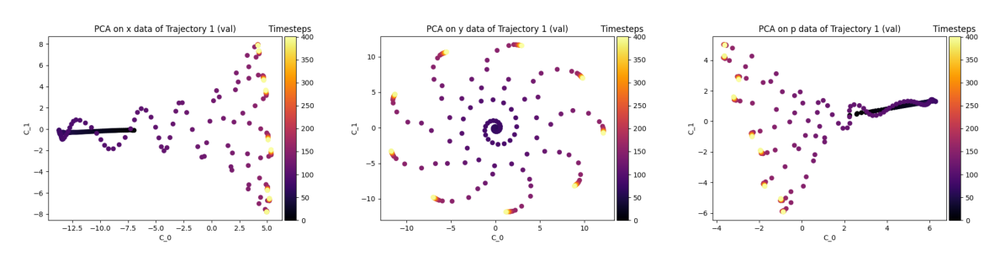

In [21]:
image_paths = []
plt.figure(figsize=(12, 8))
for i, name in zip(range(3), ['x', 'y', 'p']):
    reducer = PCA(n_components=2)
    x_reduced = reducer.fit_transform(raw['x'][1,:,:,i])

    fig, ax = plt.subplots(1)
    plt.scatter(x_reduced[:,0], x_reduced[:,1], c=np.arange(len(x_reduced)), cmap="inferno")
    plt.title(f'PCA on {name} data of Trajectory 1 (val)')
    plt.ylabel('C_1')
    plt.xlabel('C_0')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    norm = plt.Normalize(0, len(x_reduced))
    sm = plt.cm.ScalarMappable(cmap="inferno", norm=norm)
    fig.colorbar(sm, cax=cax, orientation="vertical")
    plt.title('Timesteps')
    fname = f'nvidia_visualizations/pca_{name}_1.png'
    plt.savefig(fname)
    plt.clf()
    image_paths.append(fname)
    
fig, axes = plt.subplots(1, 3, figsize=(12, 24))
for i, ax in enumerate(axes.flat):
    img = plt.imread(image_paths[i])  # Read image
    ax.imshow(img)                      # Display image
    ax.axis('off')                      # Hide axes
plt.tight_layout()
plt.savefig('pca_val_dataspace.png', bbox_inches='tight', dpi=300)
plt.show()

In [4]:
from matplotlib.tri import Triangulation
from matplotlib import tri as mtri
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.pyplot as plt

In [34]:
@torch.no_grad()
def plot_mesh(velocity, mesh_pos, faces):
    """
    Plots two graphs with each other.
    Can be used to plot the predicted graph and the ground truth
    """
    #fig, ax = plt.subplots(1, 1, figsize=(20, 16))
    fig, ax = plt.subplots(1, 1, figsize=(40, 32))

    ax.cla()
    ax.set_aspect("equal")
    ax.tick_params(axis='both', which='major', labelsize=40)
    ax.tick_params(axis='both', which='minor', labelsize=40)
    ax.autoscale(enable=True, axis='both', tight=True)
    #ax.set_axis_off()
    
    print(mesh_pos.shape, faces.shape, velocity.shape)

    triang = mtri.Triangulation(mesh_pos[:, 0].cpu(), mesh_pos[:, 1].cpu(), faces.cpu())
    mesh_plot = ax.tripcolor(
        triang, velocity.cpu(), vmin=velocity.min(), vmax=velocity.max(), shading="flat"
    )
    ax.triplot(triang, "ko-", ms=0.5, lw=0.3)

    ax.set_title('Mesh', fontsize="40")
    
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.5)
    clb = fig.colorbar(mesh_plot, cax=cax, orientation="vertical")
    clb.ax.tick_params(labelsize=40)
    clb.ax.set_title("x velocity (m/s)", fontdict={"fontsize": 40})
    return fig

In [6]:
from scipy.spatial import Delaunay

In [12]:
tri = Delaunay(pos)
faces = tri.simplices
faces.shape

(3369, 3)

In [13]:
idx = np.where((pos[:,0] < 0.6) & 
         (pos[:,0] > -0.6) & 
         (pos[:,1] < 0.6) & 
         (pos[:,1] > -0.6)
         )

r = np.sqrt(pos[idx,0]**2 + pos[idx,1]**2)[0]
order = r.argsort()
print(r[order][:62])

[0.51034284 0.51036683 0.51115286 0.51169774 0.51214563 0.51229098
 0.51231695 0.51243372 0.51288404 0.5130892  0.51310612 0.5131595
 0.51339334 0.51370423 0.51375542 0.51383136 0.5138346  0.51394264
 0.51429085 0.51460302 0.51480227 0.51496578 0.51500218 0.51507056
 0.51520867 0.5152983  0.51531399 0.51531597 0.51534555 0.51540479
 0.51544889 0.51546644 0.51559614 0.51564894 0.51572309 0.51578614
 0.51585905 0.51600142 0.51616043 0.51628746 0.51636121 0.51648478
 0.51657064 0.51660266 0.51664711 0.51670615 0.51686136 0.51693061
 0.51707069 0.51710145 0.51710615 0.51721235 0.5174132  0.51741473
 0.51753472 0.51757093 0.51785846 0.51786007 0.51830752 0.51834759
 0.51935818 0.51956421]


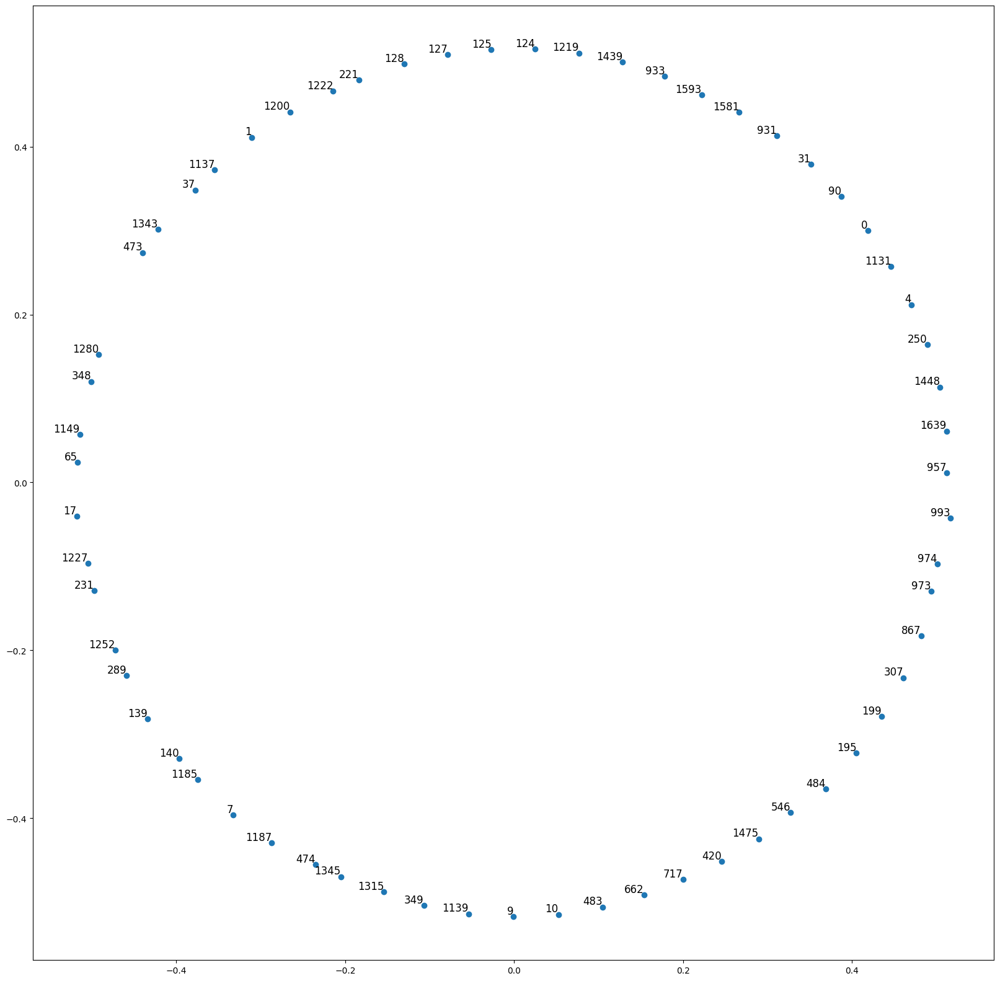

In [14]:
plt.figure(figsize=(20,20))
x = pos[idx,0]
y = pos[idx,1]
plt.scatter(x[0, order][:62], y[0, order][:62])
for i, label in enumerate(idx[0][order][:62]):
    plt.text(pos[label,0], pos[label,1], str(label), fontsize=12, ha='right', va='bottom')

In [15]:
order

array([197, 196, 258, 139, 291, 123, 195, 262, 250, 243,  80,  99, 159,
        15,  85, 211, 245, 279, 118, 152, 253, 235, 106, 107,   1, 209,
       176,  46,   0, 288,  50, 230,  45,   3, 188, 300,  31,  43,  93,
       232, 102, 127,  13, 186,  42, 213,  74, 277, 275,   7, 241,   6,
         5,  23, 215,  49, 122,  73, 200, 260, 128,   9, 124, 296, 161,
       116, 182, 278,  81, 187, 158, 204, 242, 160, 261, 185,  14,  58,
        66, 298,  12, 227,  11, 143, 265, 219,  22, 286, 226, 254, 104,
       136,  64, 181, 210,  51, 229, 224, 205, 177, 156,  84, 251, 290,
        53, 264,  78,  18, 150, 208,  92,  24,  91,  98,  65, 137, 268,
       154, 138,  71, 144,  38, 198, 129, 292, 183, 295, 201, 114, 276,
       222, 257,  62, 293, 223,  32,  47,  54,  57,   8, 113, 273, 175,
        44,  20,  68, 174, 157,  35, 103, 153,  79, 192, 301, 126,  67,
       247, 266,   2, 151,  70, 299,  36, 212, 155,  87, 147,  10, 145,
       239,  41,  40, 237, 115, 121, 228,  33, 238, 105, 236,  6

In [16]:
cylinder_idx = idx[0][order][:62] # points around cylinder
cylinder_idx

array([ 974,  973, 1315,  546, 1593,  474,  957, 1345, 1252, 1222,  221,
        289,  717,   37,  231, 1137, 1227, 1475,  420,  662, 1280, 1200,
        348,  349,    1, 1131,  867,  128,    0, 1581,  140, 1185,  127,
          4,  933, 1639,   90,  125,  250, 1187,  307,  483,   31,  931,
        124, 1139,  199, 1448, 1439,   10, 1219,    9,    7,   65, 1149,
        139,  473,  195,  993, 1343,  484,   17])

In [17]:
b = np.zeros_like(pos[:,0])
b[idx[0][order][:62]] = 1

In [168]:
tri = Delaunay(pos,incremental=True)
tri.simplices.shape

(3369, 3)

torch.Size([1699, 2]) torch.Size([3369, 3]) torch.Size([1699])
torch.Size([1699, 2]) torch.Size([3369, 3]) torch.Size([1699])
torch.Size([1699, 2]) torch.Size([3369, 3]) torch.Size([1699])
torch.Size([1699, 2]) torch.Size([3369, 3]) torch.Size([1699])
torch.Size([1699, 2]) torch.Size([3369, 3]) torch.Size([1699])
torch.Size([1699, 2]) torch.Size([3369, 3]) torch.Size([1699])


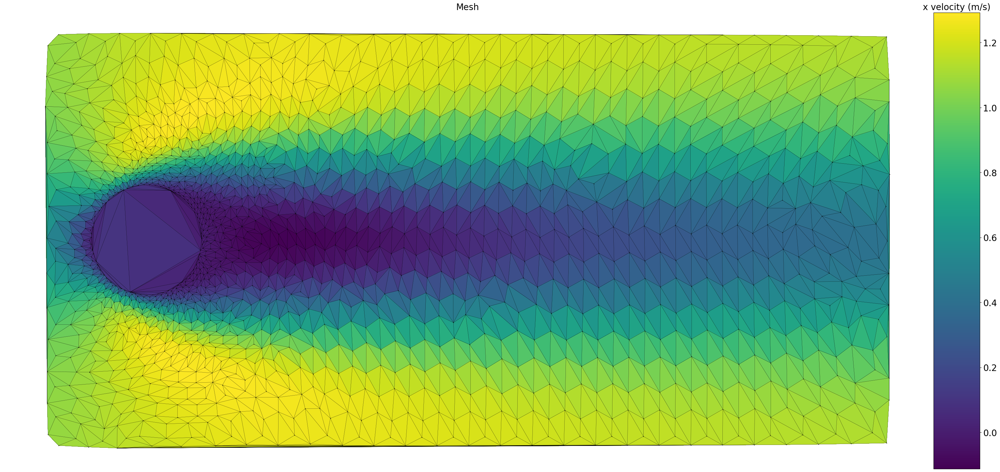

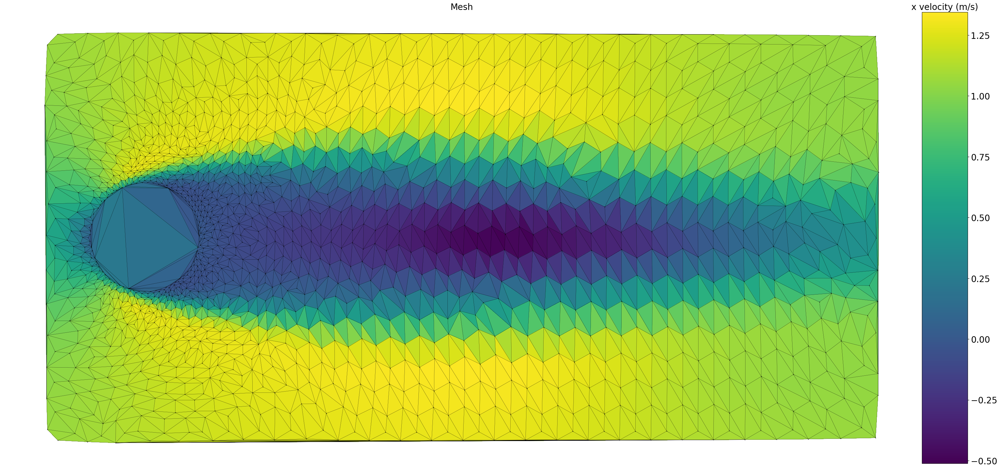

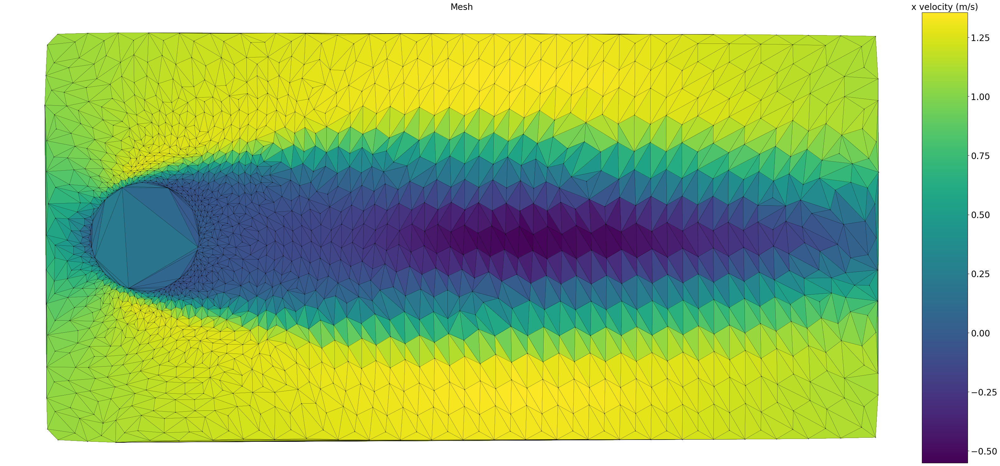

Error in callback <function flush_figures at 0x720f3b062e60> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

In [ ]:
pos = np.loadtxt(f"dataset/meshPosition_all.txt")
faces = Triangulation(pos[:,0], pos[:,1]).triangles

for i in range(0, 120, 20):
    plot_mesh(torch.from_numpy(raw['x'][0,i,:,0]), torch.from_numpy(pos), torch.from_numpy(faces))

torch.Size([1699, 2]) torch.Size([3369, 3]) torch.Size([1699])


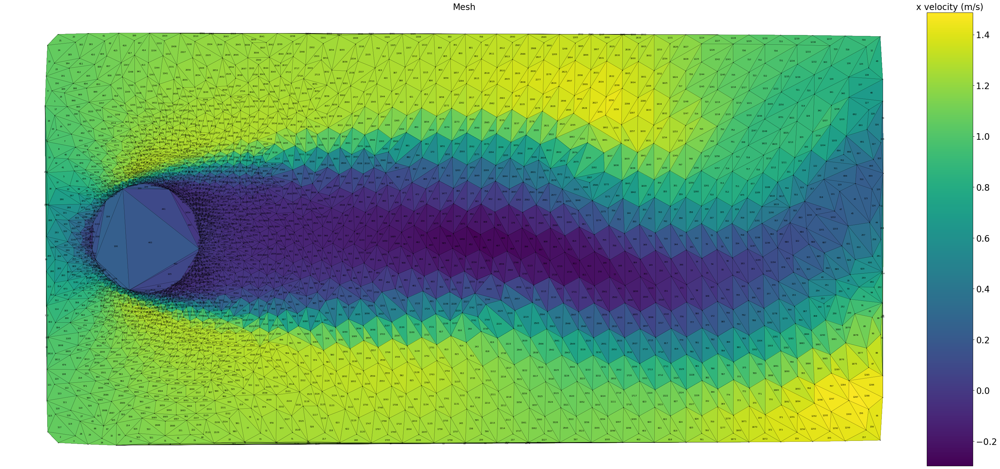

In [187]:
fig = plot_mesh(torch.from_numpy(raw['x'][0,100,:,0]), torch.from_numpy(pos), torch.from_numpy(faces))

ax = fig.axes[0]
for i, triangle in enumerate(faces):
    # Compute barycenter (average x and y of triangle's three vertices)
    xc = np.mean(pos[:,0][triangle])
    yc = np.mean(pos[:,1][triangle])

    # Add annotation
    ax.text(xc, yc, f'{i}', color='black', ha='center', va='center', fontsize=5)


In [18]:
filtered_faces = []
for face in faces:
    if len(set(face) & set(cylinder_idx)) < 3:
        filtered_faces.append(face)
filtered_faces = np.array(filtered_faces)

torch.Size([1699, 2]) torch.Size([3309, 3]) torch.Size([1699])


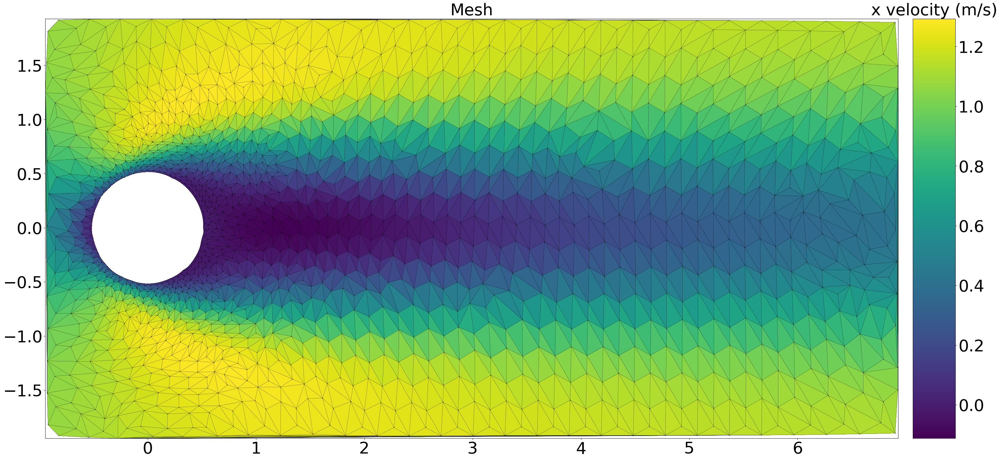

In [41]:
tri = Delaunay(pos)
faces = tri.simplices
traj = 50
time = 0
fig = plot_mesh(torch.from_numpy(raw['x'][traj,time,:,0]), torch.from_numpy(pos), torch.from_numpy(filtered_faces))
fig.savefig(f'visualize_traj_{traj}_t{time}.png', bbox_inches='tight')

In [200]:
np.where(raw['x'][0,100,:,2] == 0)

(array([], dtype=int64),)

In [203]:
raw.keys()

dict_keys(['x', 'edge_attr', 'edge_index', 'mass', 'para'])

In [212]:
raw['mass'][:,0]

array([0.00021455, 0.00021366, 0.00599751, ..., 0.00655172, 0.0103502 ,
       0.00729694])

In [220]:
np.where(raw['mass'][:,0] < 0.001)[0].shape

(493,)

In [223]:
np.save('mat_delaunay_all.npy', faces)

In [224]:
np.save('mat_delaunay_filtered.npy', filtered_faces)